# HW11: Deep Learning

## Syed Nisar Hussain

### sh07126@st.habib.edu.pk


In [261]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
import numpy as np

### Part 1


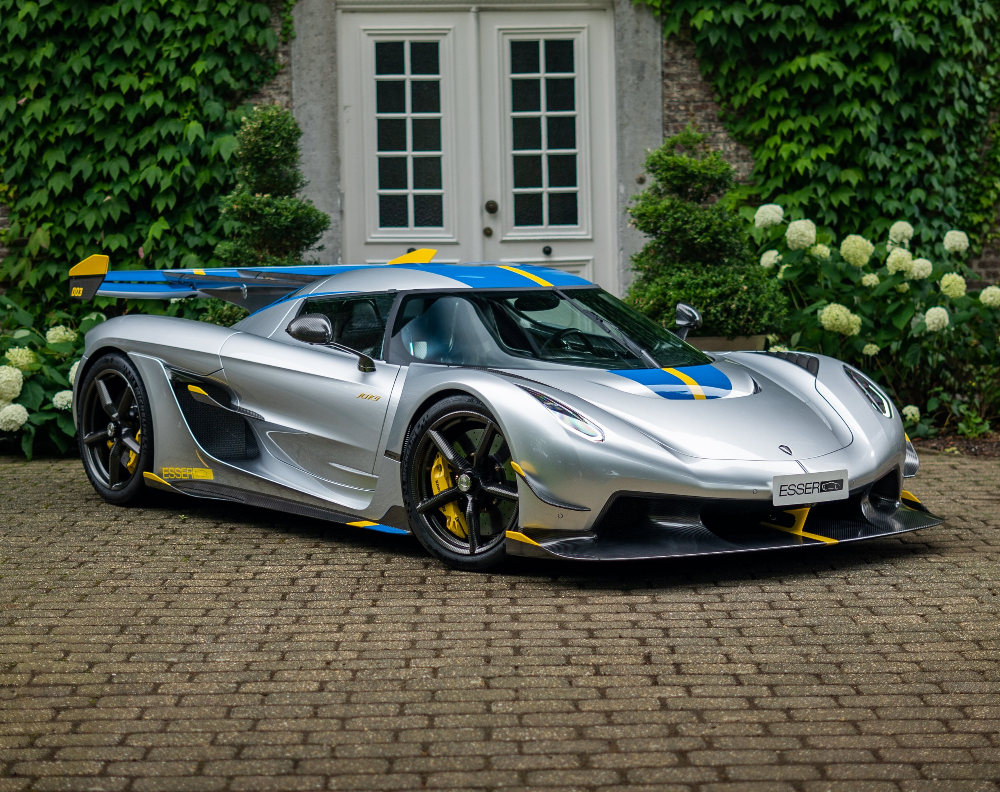

In [262]:
img = Image.open("car.jpg")
img = img.convert("RGB")
img

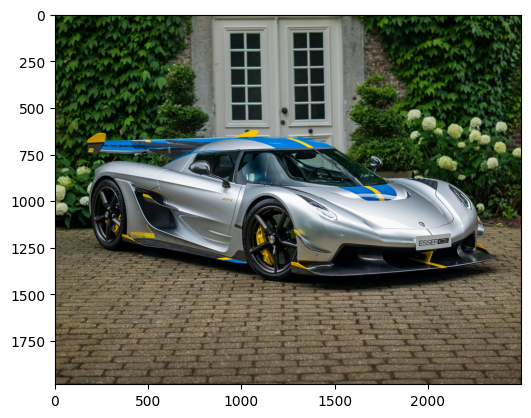

In [263]:
plt.imshow(img)
plt.show()

In [264]:
gaussian_blur = img.filter(ImageFilter.BoxBlur(9))

edge_detection = img.filter(ImageFilter.FIND_EDGES)

sharpen = img.filter(ImageFilter.SHARPEN)

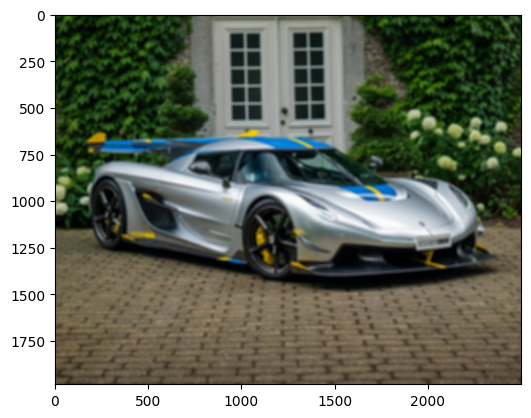

In [265]:
plt.imshow(gaussian_blur)

**Description:** The BoxBlur filter averages the pixel values within a given radius (a square kernel) around each pixel.
It is a linear, low-pass filter that smooths the image by reducing intensity variations.

**Purpose:** The BoxBlur filter is used to reduce noise and smooth the image, it’s often applied in tasks where high-frequency details are not important, like preprocessing or downscaling an image.

**Output:** The resulting image appears blurred, with sharp edges and fine details softened. The degree of blur depends on the radius value. In this case, with radius 9 the degree of blur is higher.

**Explanation:** The BoxBlur output matches its purpose by reducing noise and details. It is useful in applications where general smoothing is required without focusing on edge preservation.


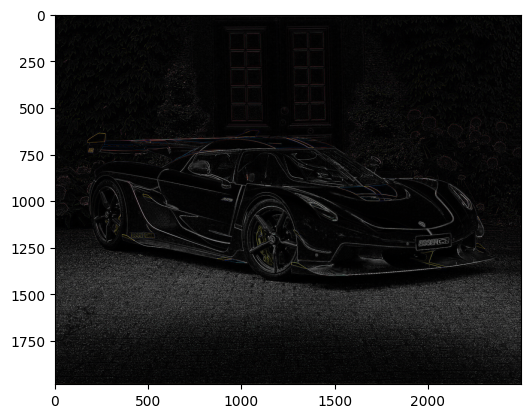

In [266]:
plt.imshow(edge_detection)

**Description:** The edge detection filter (FIND_EDGES filter) highlights areas in the image with significant intensity changes, identifying object boundaries.

**Purpose:** The goal of edge detection is to outline objects in the image by focusing on sharp transitions in pixel values.
It is commonly used in image processing to detect shapes and structures.

**Output:** The output is a binary-like image where edges are prominently visible, and other parts of the image appear darker or absent.
Clear boundaries and object outlines are highlighted.

**Explanation:** The filter's output aligns well with its purpose. The edges of objects and prominent transitions in the image are effectively captured.
It works particularly well for images with clear and distinguishable objects.


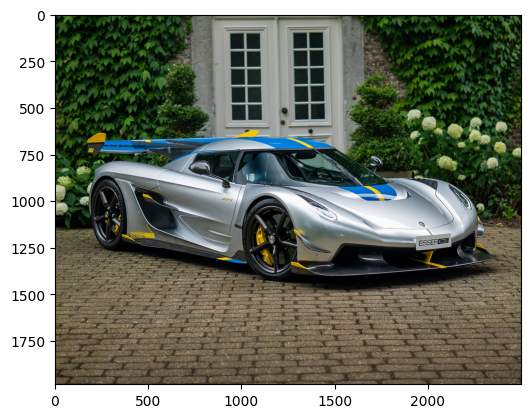

In [267]:
plt.imshow(sharpen)

**Description:** The sharpen filter enhances the contrast of adjacent pixels, making edges and fine details in the image more pronounced.

**Purpose:** The sharpening filter is used to make images clearer and more defined by intensifying the differences between neighboring pixels.
It is often used to improve the quality of images that appear slightly blurry or to enhance important details.

**Output:** The output is a more defined and detailed version of the original image. Edges are clearer, and textures are more noticeable.

**Explanation:** The sharpening filter performs as expected. It enhances the edges and fine details of the image, making it appear crisper.
The output demonstrates the effectiveness of sharpening in improving the perceived sharpness of an image.


### Part 2


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation
from tensorflow.keras.layers import Conv2D, MaxPooling2D

In [ ]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
print(len(x_train), len(y_train))
print(len(x_test), len(y_test))

60000 60000
10000 10000


In [270]:
# Selecting two classes (digits 3 and 7)
train_filter = (y_train == 3) | (y_train == 7)
test_filter = (y_test == 3) | (y_test == 7)

x_train, y_train = x_train[train_filter], y_train[train_filter]
x_test, y_test = x_test[test_filter], y_test[test_filter]

# Normalizing pixel values to [0, 1]
x_train = x_train / 255.0
x_test = x_test / 255.0

# Converting labels to binary (3 -> 0, 7 -> 1)
y_train = (y_train == 7).astype(int)
y_test = (y_test == 7).astype(int)

# 50 training and 15 testing samples per class
train_class_3 = x_train[y_train == 0][:50]
train_class_7 = x_train[y_train == 1][:50]
test_class_3 = x_test[y_test == 0][:15]
test_class_7 = x_test[y_test == 1][:15]

x_train = np.concatenate([train_class_3, train_class_7], axis=0)
y_train = np.array([0]*50 + [1]*50)
x_test = np.concatenate([test_class_3, test_class_7], axis=0)
y_test = np.array([0]*15 + [1]*15)

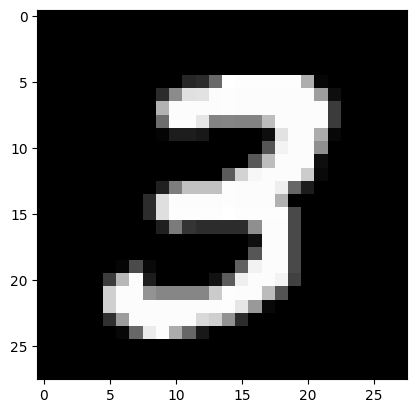

In [271]:
plt.imshow(train_class_3[0], cmap='gray')

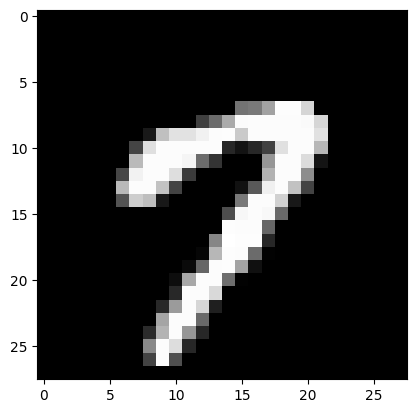

In [272]:
plt.imshow(train_class_7[0], cmap='gray')

Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.4844 - loss: 0.6940 - val_accuracy: 0.8667 - val_loss: 0.6805
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6941 - loss: 0.6725 - val_accuracy: 0.8667 - val_loss: 0.6660
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7276 - loss: 0.6616 - val_accuracy: 0.9000 - val_loss: 0.6494
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8605 - loss: 0.6303 - val_accuracy: 0.9333 - val_loss: 0.6262
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9017 - loss: 0.6021 - val_accuracy: 0.9333 - val_loss: 0.5967
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8822 - loss: 0.5894 - val_accuracy: 0.9000 - val_loss: 0.5617
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9112 - loss: 0.5319 - val_accuracy: 0.9000 - val_loss: 0.5219
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9109 - loss: 0.4694 - val_accuracy: 0.9667 - val_loss: 0.4688


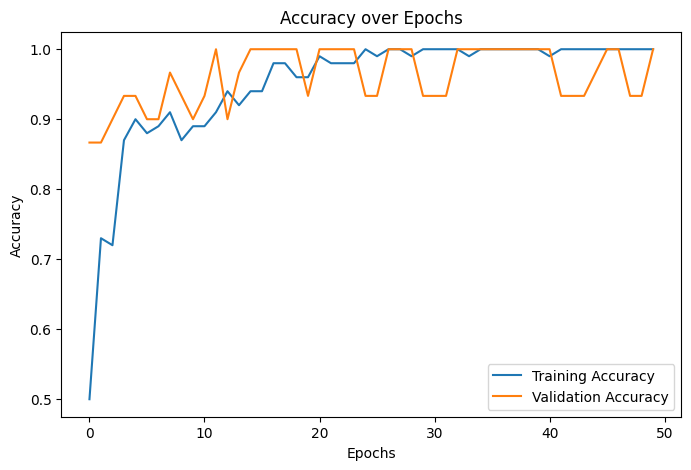

In [273]:
model = Sequential([
    Conv2D(32, (2, 2), input_shape=(28,28, 1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(32, (2, 2)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (2, 2)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(64),
    Activation('relu'),
    Dropout(0.5),

    Dense(1),
    Activation('sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(x_train, y_train, epochs=50, validation_data=(x_test, y_test))

plt.figure(figsize=(8, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [274]:
model.save("mnist_model.keras")

**Accuracy Results:** Over 50 epochs iterations, the best training and validation accuracy score, as can be seen in the plot above, is 1.00. This means that our model is perfect in classifying between the digits 3 and 7. With these results, we can expect our model to perform well in classifying unseen images as well.


In [275]:
from keras.models import load_model
 
loaded_model = load_model('mnist_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


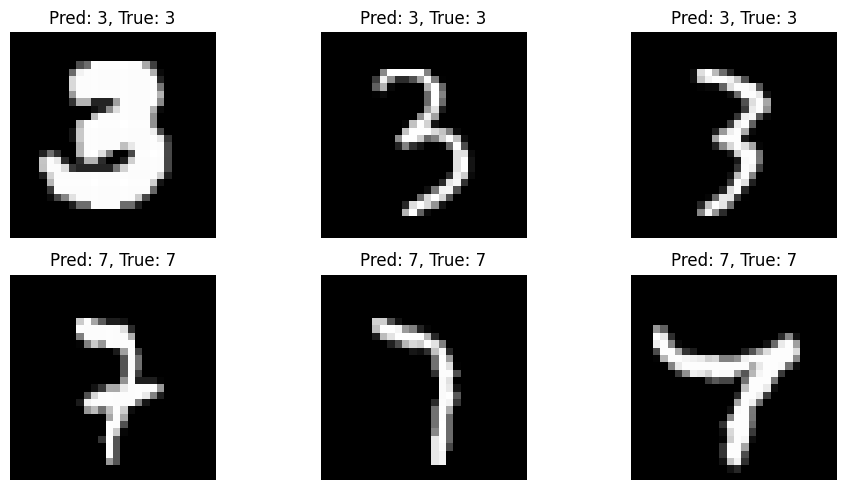

In [276]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

test_filter = (y_test == 3) | (y_test == 7)

x_test, y_test = x_test[test_filter], y_test[test_filter]

x_test = x_test / 255.0

y_test = (y_test == 7).astype(int)

test_class_3 = x_test[y_test == 0][16:19] # 3 unseen images of digit 3
test_class_7 = x_test[y_test == 1][16:19] # 3 unseen images of digit 7

unseen_images = np.concatenate([test_class_3, test_class_7], axis=0)
unseen_labels = np.array([3]*3 + [7]*3)

predictions = loaded_model.predict(unseen_images)

# Display unseen images and predictions
plt.figure(figsize=(10, 5))
for i in range(len(unseen_images)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(unseen_images[i], cmap='gray')
    pred_label = "7" if predictions[i] > 0.5 else "3"
    plt.title(f"Pred: {pred_label}, True: {unseen_labels[i]}")
    plt.axis("off")
plt.tight_layout()
plt.show()


**Discussion:** We can observe that the model predicted all 6 unseen images accurately. This goes along with what we expected based on the accuracy scores that we got while training the model. This indicates that this model can be further used for such digit classification tasks, and can be improved to inlucde other digits as well.
